```
conda create -n yolo11 -y python=3.11
conda activate yolo11
pip install -U ultralytics
 ```

In [1]:
import os
HOME = os.getcwd() # aktuelles Arbeitsverzeichnis
print('HOME:', HOME)

isExists = os.path.exists(HOME + '\Dataset')
print('isExists:', isExists)
if not isExists:
    print('Laden Sie sich die Bilddateien von der Moodle Seite herunter')
else:
    print('Verzeichnis vorhanden')
    
imageFilesPath = HOME + '\Dataset\PNGImages' # aktuelles Arbeitsverzeichnis + Bilddateien
imageFiles = os.listdir(imageFilesPath) # Liste der Bilddateiennamen im Verzeichnis (ohne Pfad)
print('imageFiles:', imageFiles)

numImages = len(imageFiles)
print('numImages:', numImages)

print(imageFiles[0:5:2])

# path of first image
firstImagePath = imageFilesPath + '\\' + imageFiles[0]
print('firstImagePath:', firstImagePath)

HOME: c:\Users\adrianishak.duda\OneDrive - Hexagon\Documents\Experiment\Python\ComputerVision
isExists: True
Verzeichnis vorhanden
imageFiles: ['FudanPed00001.png', 'FudanPed00002.png', 'FudanPed00003.png', 'FudanPed00004.png', 'FudanPed00005.png', 'FudanPed00006.png', 'FudanPed00007.png', 'FudanPed00008.png', 'FudanPed00009.png', 'FudanPed00010.png', 'FudanPed00011.png', 'FudanPed00012.png', 'FudanPed00013.png', 'FudanPed00014.png', 'FudanPed00015.png', 'FudanPed00016.png', 'FudanPed00017.png', 'FudanPed00018.png', 'FudanPed00019.png', 'FudanPed00020.png', 'FudanPed00021.png', 'FudanPed00022.png', 'FudanPed00023.png', 'FudanPed00024.png', 'FudanPed00025.png', 'FudanPed00026.png', 'FudanPed00027.png', 'FudanPed00028.png', 'FudanPed00029.png', 'FudanPed00030.png', 'FudanPed00031.png', 'FudanPed00032.png', 'FudanPed00033.png', 'FudanPed00034.png', 'FudanPed00035.png', 'FudanPed00036.png', 'FudanPed00037.png', 'FudanPed00038.png', 'FudanPed00039.png', 'FudanPed00040.png', 'FudanPed00041.p

# Ein einzelnes Bild (Personen/Autos/Taschen) testen


image 1/1 c:\Users\adrianishak.duda\OneDrive - Hexagon\Documents\Experiment\Python\ComputerVision\Dataset\PNGImages\FudanPed00001.png: 928x960 2 persons, 1 skateboard, 274.1ms
Speed: 24.5ms preprocess, 274.1ms inference, 3.3ms postprocess per image at shape (1, 3, 928, 960)
Results saved to C:\Users\adrianishak.duda\OneDrive - Hexagon\Documents\Experiment\Python\ComputerVision\runs\detect\predict16
tensor([ 0.,  0., 36.]) tensor([0.9079, 0.8488, 0.3317])


(-0.5, 558.5, 535.5, -0.5)

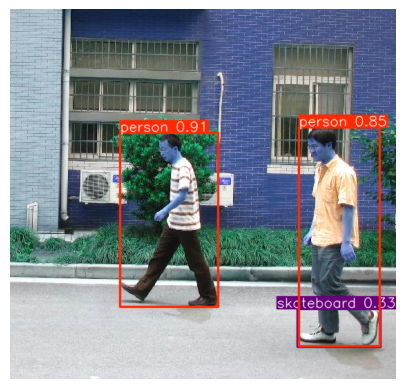

In [ ]:
# detect_one.py
from ultralytics import YOLO

model = YOLO("yolo11n.pt")           # COCO, v11, nano
results = model.predict(
    source=firstImagePath,
    imgsz=960,                        # etwas größer für bessere Qualität
    conf=0.25,                        # Konfidenzschwelle
    save=True,                        # speichert visuelles Ergebnis in runs/detect/predict...
)

# Optional: nur bestimmte Klassen (z.B. person=0, car=2, handbag=26 bei COCO)
# results = model.predict(source="sample.jpg", classes=[0,2,26], save=True)
print(results[0].boxes.cls[:10], results[0].boxes.conf[:10])

annotated = results[0].plot()

# Anzeige des Ergebnisses
import matplotlib.pyplot as plt
plt.imshow(annotated)
plt.axis('off')


# Batch-Versuch auf deinem PedestrianDataset (die ersten 10 Bilder)

[01] FudanPed00001: YOLO boxes=2 in 296.6 ms | HOG boxes=2 in 285.2 ms
[02] FudanPed00002: YOLO boxes=2 in 211.8 ms | HOG boxes=1 in 180.7 ms
[03] FudanPed00003: YOLO boxes=1 in 169.5 ms | HOG boxes=1 in 156.2 ms
[04] FudanPed00004: YOLO boxes=3 in 173.6 ms | HOG boxes=2 in 135.1 ms
[05] FudanPed00005: YOLO boxes=3 in 212.7 ms | HOG boxes=0 in 63.7 ms
[06] FudanPed00006: YOLO boxes=4 in 274.6 ms | HOG boxes=1 in 134.8 ms
[07] FudanPed00007: YOLO boxes=6 in 227.3 ms | HOG boxes=4 in 133.0 ms
[08] FudanPed00008: YOLO boxes=4 in 239.6 ms | HOG boxes=2 in 184.9 ms
[09] FudanPed00009: YOLO boxes=9 in 193.1 ms | HOG boxes=0 in 137.1 ms
[10] FudanPed00010: YOLO boxes=2 in 219.6 ms | HOG boxes=1 in 119.6 ms
Fertig. Ergebnisse liegen in: out_compare


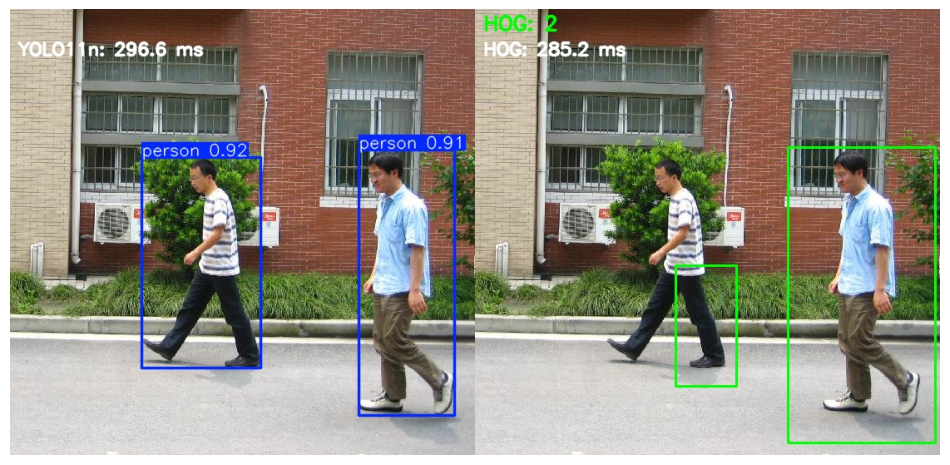

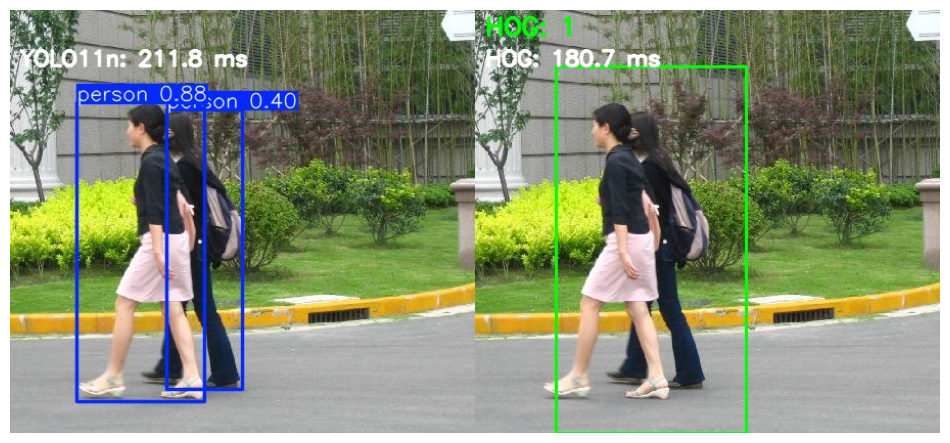

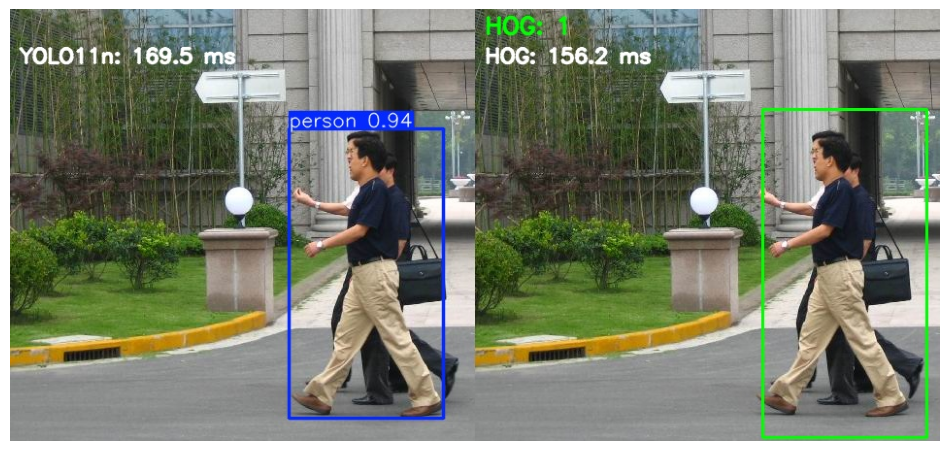

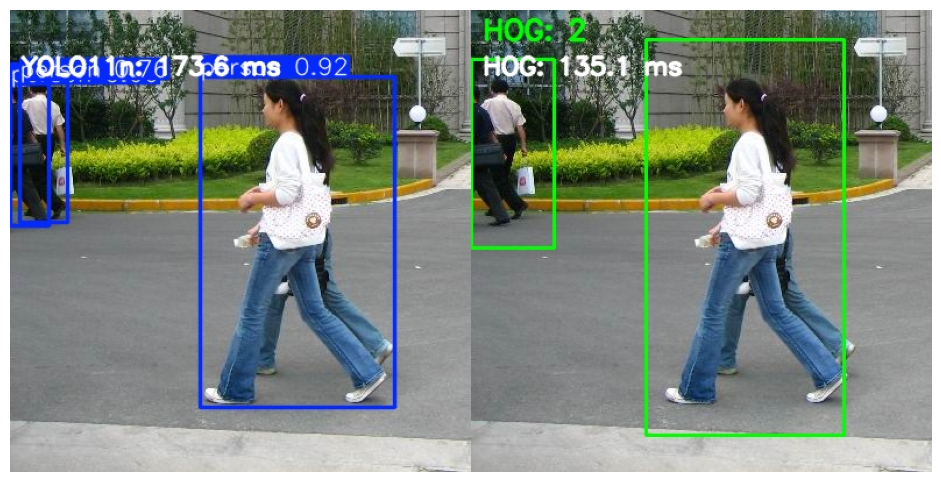

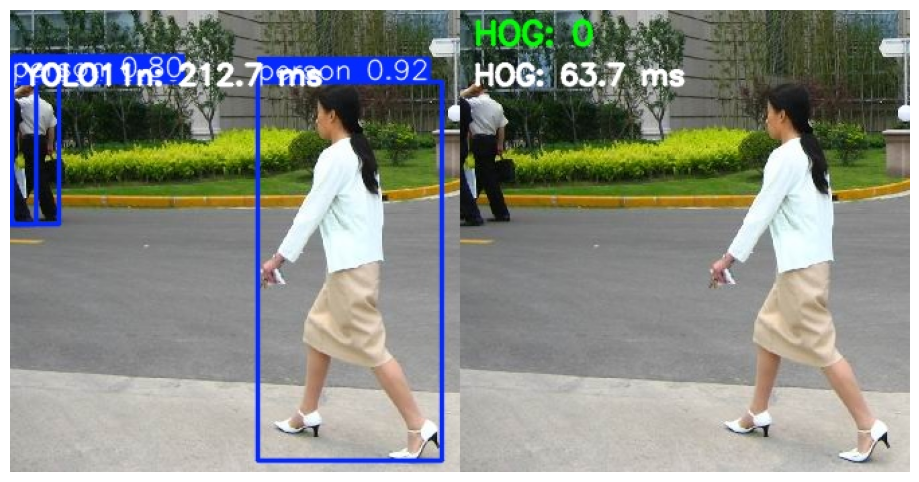

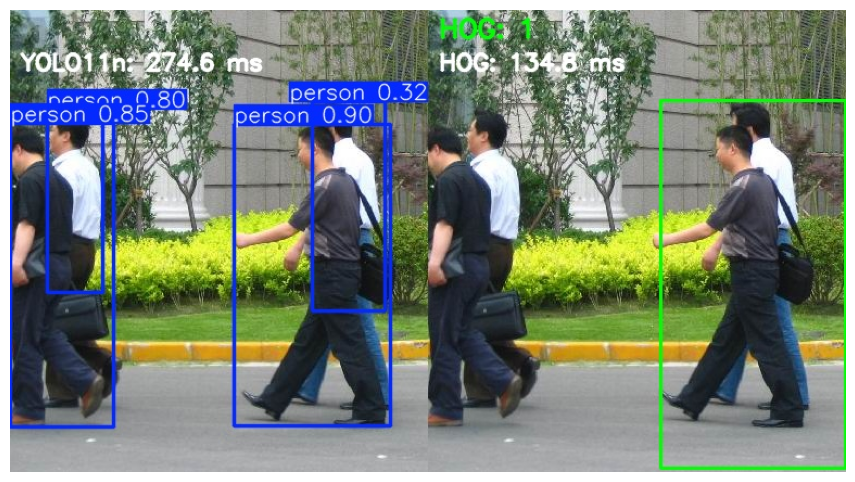

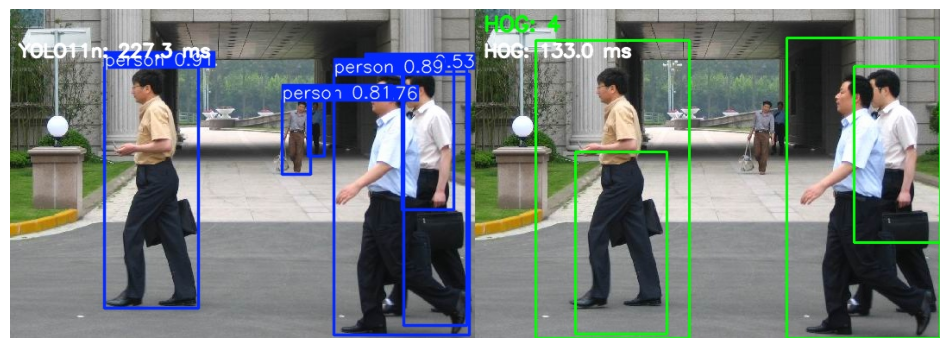

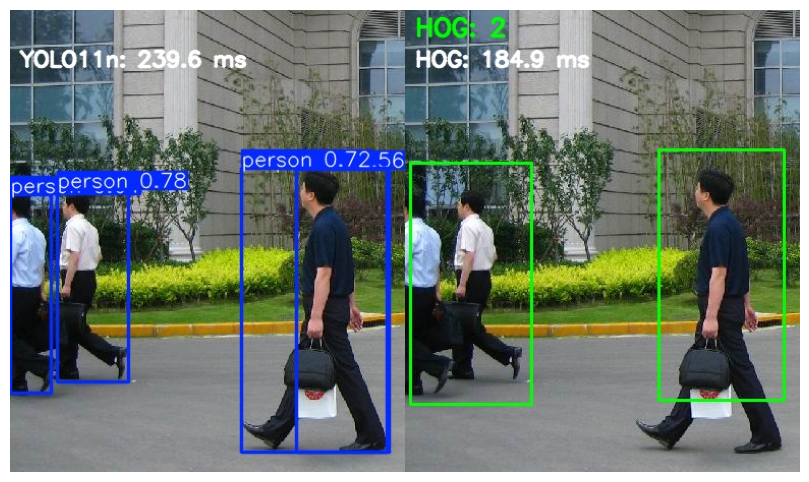

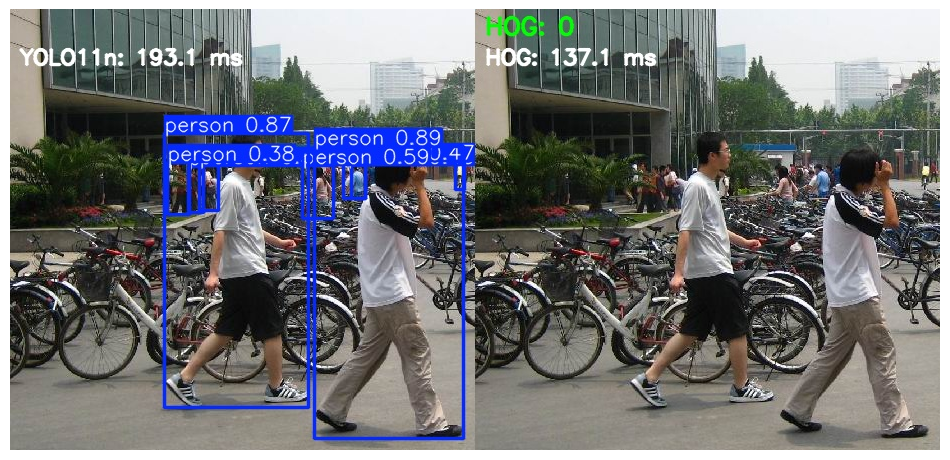

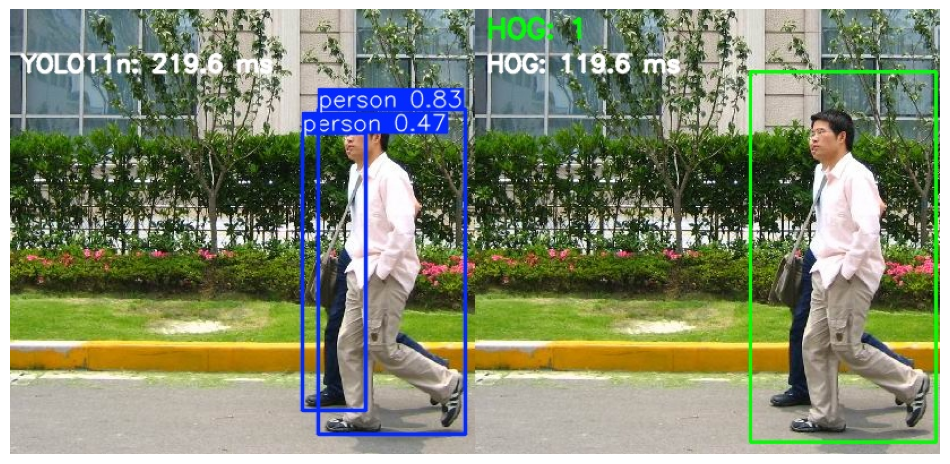

In [3]:
# compare_yolo11_vs_hog.py
import time, os, glob
import cv2
import numpy as np
from ultralytics import YOLO

def hog_detect_bboxes(img_bgr, hog):
    rects, weights = hog.detectMultiScale(
        img_bgr,
        winStride=(8, 8),
        padding=(8, 8),
        scale=1.05
    )
    # rects: Liste von (x,y,w,h)
    return rects, weights

IMG_DIR = "C:\\Users\\adrianishak.duda\\OneDrive - Hexagon\\Documents\\Experiment\\Python\\Jupyter\\Dataset\\PNGImages"   # <-- Passe deinen Pfad an
OUT_DIR = "out_compare"
os.makedirs(OUT_DIR, exist_ok=True)

# 1) YOLO11n laden
yolo = YOLO("yolo11n.pt")  # COCO, Klasse 0 = person

# 2) HOG initialisieren
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

# 3) Bilder sammeln (erste 10)
img_paths = sorted(glob.glob(os.path.join(IMG_DIR, "*.*")))[:10]
assert img_paths, f"Keine Bilder in {IMG_DIR} gefunden."

def draw_rects(img, rects, color=(0,255,0), label="HOG"):
    canvas = img.copy()
    for (x,y,w,h) in rects:
        cv2.rectangle(canvas, (x,y), (x+w, y+h), color, 2)
    if label:
        cv2.putText(canvas, f"{label}: {len(rects)}", (10,25),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2, cv2.LINE_AA)
    return canvas

def put_runtime(img, ms, where="YOLO"):
    out = img.copy()
    cv2.putText(out, f"{where}: {ms:.1f} ms", (10,55),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,255,255), 2, cv2.LINE_AA)
    return out

for i, p in enumerate(img_paths, 1):
    img_bgr = cv2.imread(p)
    assert img_bgr is not None, f"Kann {p} nicht lesen"
    
    # ---- YOLO11 (verwende direkt das BGR Bild) ----
    t0 = time.time()
    yolo_res = yolo.predict(source=img_bgr, verbose=False, classes=[0], conf=0.25)[0]
    t1 = time.time()
    yolo_ms = (t1 - t0) * 1000

    yolo_vis = yolo_res.plot()  # BGR; enthält Boxen/Labels
    yolo_vis = put_runtime(yolo_vis, yolo_ms, "YOLO11n")

    # ---- HOG ----
    t0 = time.time()
    rects, weights = hog_detect_bboxes(img_bgr, hog)
    t1 = time.time()
    hog_ms = (t1 - t0) * 1000

    hog_vis = draw_rects(img_bgr, rects, (0,255,0), "HOG")
    hog_vis = put_runtime(hog_vis, hog_ms, "HOG")

    # ---- Side-by-side speichern ----
    h = max(yolo_vis.shape[0], hog_vis.shape[0])
    yolo_pad = cv2.copyMakeBorder(yolo_vis, 0, h - yolo_vis.shape[0], 0, 0, cv2.BORDER_CONSTANT, value=(0,0,0))
    hog_pad  = cv2.copyMakeBorder(hog_vis,  0, h - hog_vis.shape[0],  0, 0, cv2.BORDER_CONSTANT, value=(0,0,0))
    concat = np.hstack([yolo_pad, hog_pad])

    base = os.path.splitext(os.path.basename(p))[0]
    cv2.imwrite(os.path.join(OUT_DIR, f"{i:02d}_{base}_compare.jpg"), concat)

    print(f"[{i:02d}] {base}: YOLO boxes={len(yolo_res.boxes)} in {yolo_ms:.1f} ms | HOG boxes={len(rects)} in {hog_ms:.1f} ms")

print(f"Fertig. Ergebnisse liegen in: {OUT_DIR}")

# Anzeige aller Ergebnisse
import matplotlib.pyplot as plt
out_images = sorted(glob.glob(os.path.join(OUT_DIR, "*_compare.jpg")))
for out_path in out_images:
    img = cv2.imread(out_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(12,6))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.show()

# Capture Picture from camera


image 1/1 c:\Users\adrianishak.duda\OneDrive - Hexagon\Documents\Experiment\Python\ComputerVision\camera_image.jpg: 736x960 1 person, 1 dining table, 1 cell phone, 1 vase, 281.5ms
Speed: 7.2ms preprocess, 281.5ms inference, 2.9ms postprocess per image at shape (1, 3, 736, 960)
Results saved to C:\Users\adrianishak.duda\OneDrive - Hexagon\Documents\Experiment\Python\ComputerVision\runs\detect\predict21


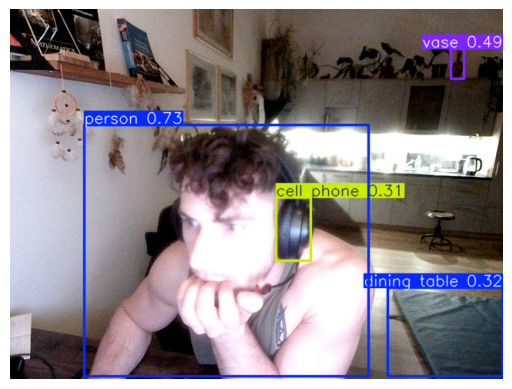

In [12]:
# make picture from camera and predict it with yolo
import cv2
import matplotlib.pyplot as plt
cap = cv2.VideoCapture(0)
ret, frame = cap.read()
cap.release()
if ret:
    cv2.imwrite("camera_image.jpg", frame)
    model = YOLO("yolo11n.pt")
    results = model.predict(source="camera_image.jpg", imgsz=960, conf=0.25, save=True)

    res = results[0]
    img = res.plot()  # BGR
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off'); plt.show()

# Capture Stream from camera

In [10]:
# now capture video from camera and predict it with yolo in real-time
import cv2
from ultralytics import YOLO
model = YOLO("yolo11n.pt")
cap = cv2.VideoCapture(0)
while True:
    ret, frame = cap.read()
    if not ret:
        break
    results = model.predict(source=frame, imgsz=320, conf=0.25, verbose=False)
    img = results[0].plot()  # BGR
    cv2.imshow("YOLO11n Real-Time Detection", img)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()
print("Programm beendet.")



Programm beendet.


# Zuckerrüben

DATASET_PATH: c:\Users\adrianishak.duda\OneDrive - Hexagon\Documents\Experiment\Python\ComputerVision\AGCO\Dataset_HSKempten.tar\Dataset_HSKempten\img


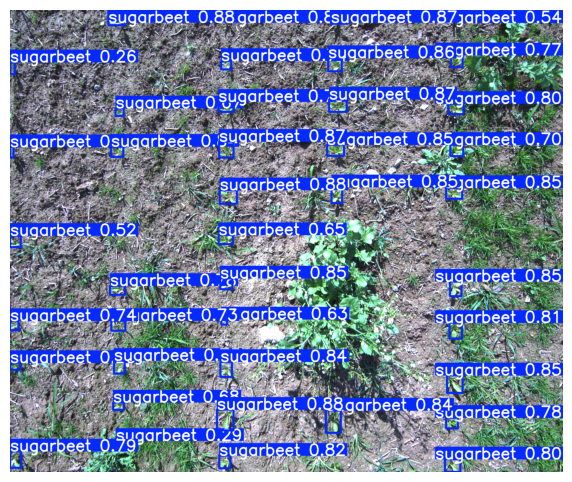

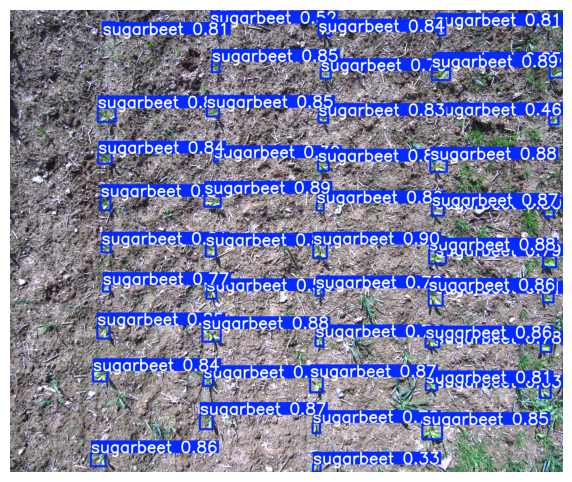

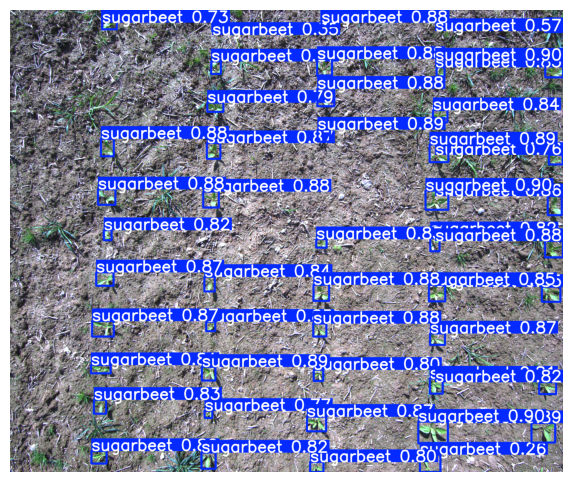

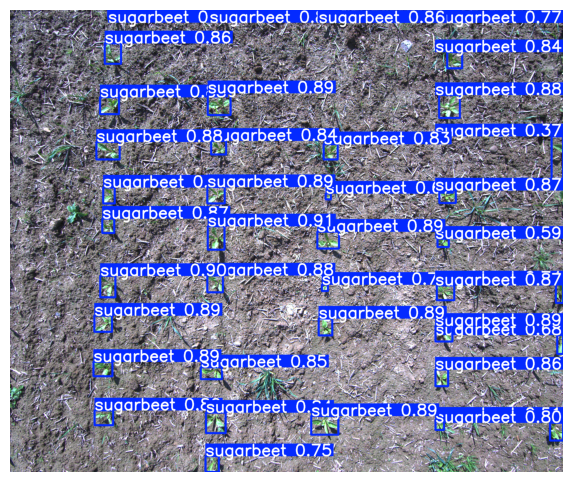

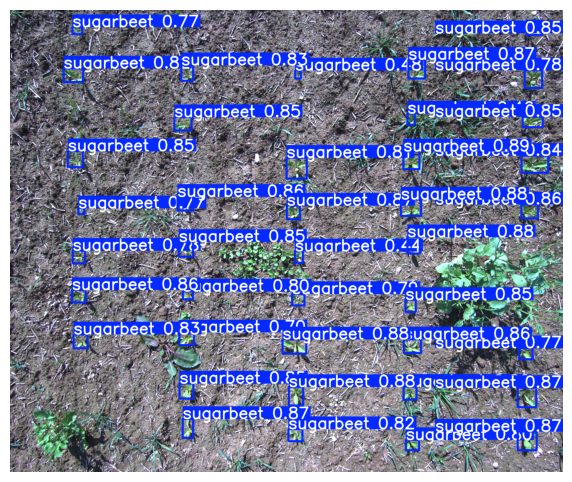

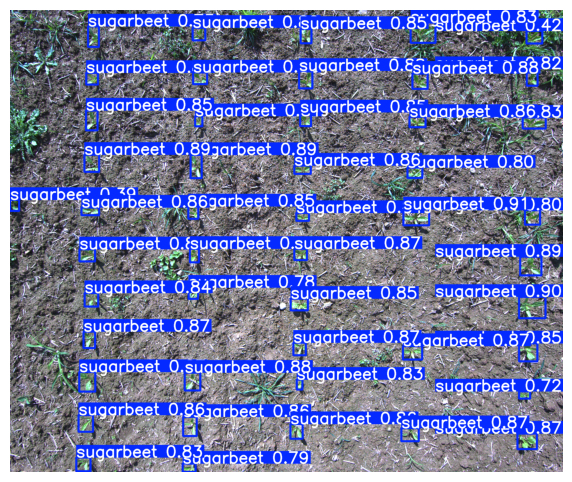

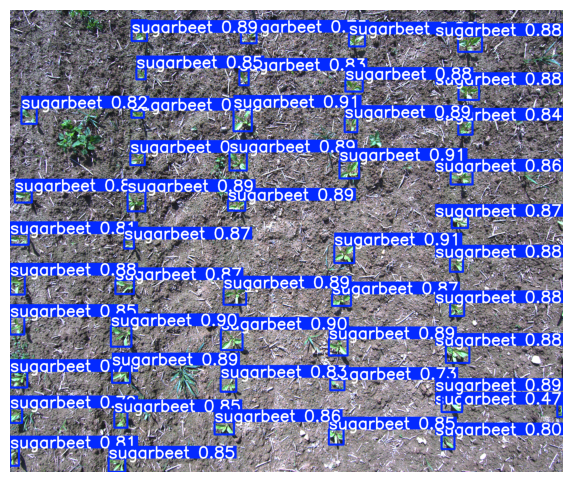

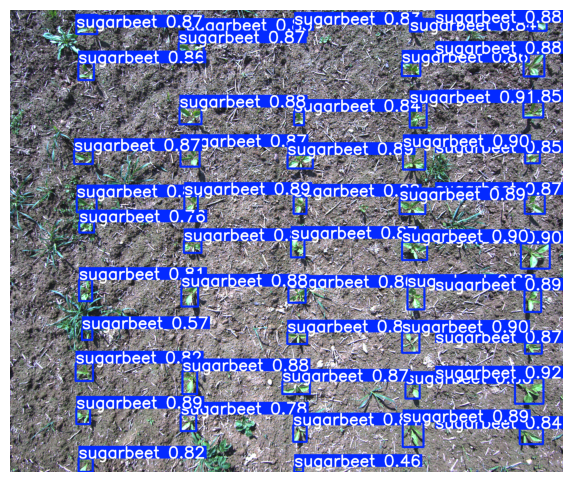

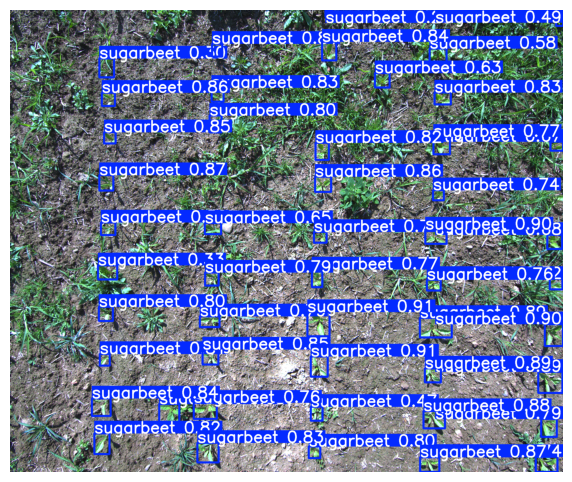

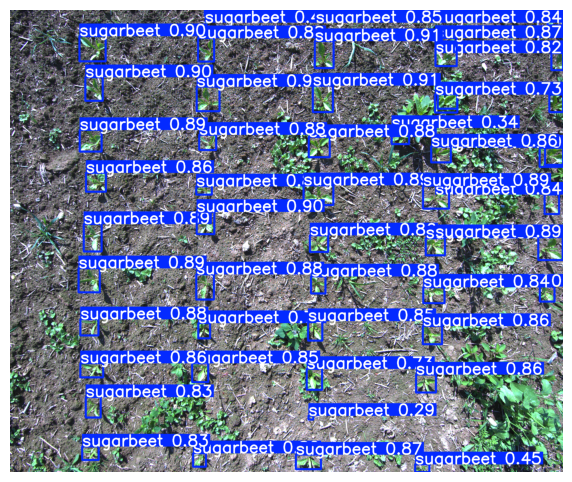

In [11]:
# load AGCO Dataset C:\Users\adrianishak.duda\OneDrive - Hexagon\Documents\Experiment\Python\Jupyter\AGCO\Dataset_HSKempten.tar\Dataset_HSKempten\img
import os
import matplotlib.pyplot as plt

HOME = os.getcwd()
DATASET_PATH = os.path.join(HOME, "AGCO\\Dataset_HSKempten.tar\\Dataset_HSKempten\\", "img")
imageFiles = os.listdir(DATASET_PATH)
print('DATASET_PATH:', DATASET_PATH)

model = YOLO("Sugarbeets11.pt")


# read 10 images from dataset and predict them with the model
for i, img_file in enumerate(imageFiles[:10]):
    img_path = os.path.join(DATASET_PATH, img_file)
    img_bgr = cv2.imread(img_path)
    results = model.predict(source=img_bgr, imgsz=960, conf=0.25, verbose=False)
    img = results[0].plot()  # BGR
    plt.figure(figsize=(10,6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off'); plt.show()


